In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'utkface-new:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F44109%2F78156%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240626%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240626T130443Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D4245e37fb7ddbaca80b04f66656bea065aba4c866287e974df31401acaf4f4a14a6a4b4c197005e4dee68e6f7eb02a0a814d0b356dcff18c0010d66d9740866b7ceafa2bc0dc7077062048bc8043eb2d5977e3ab179eaecf08aef34dcb609af7701aeab5fdf5c463555505827c2b09d859d5f3456da9ad397c464da2f89adcc5532b7b6dc43cfe59e6b30c6be41fb3e896ae7a40512e79b73cea8d34665a2a83acb2118057a6106d6bbc68ab3e0b9be58a7603829a01d09131dcbeacda5738c772398636cfb5b7b795a1f50a41e952e322a8b592f1d066e02d68c6363ee5828192c636ce8af78fe6d327132366eca6da5d00def315673c1b9b9e89d421bcad09'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/utkface-new/UTKFace/26_0_2_20170104023102422.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/22_1_1_20170112233644761.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/21_1_3_20170105003215901.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/28_0_0_20170117180555824.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/17_1_4_20170103222931966.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/44_0_3_20170119201022260.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/35_0_2_20170116182734834.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/76_0_0_20170104213515132.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/36_1_0_20170116165722892.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/34_0_3_20170119200815948.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/18_1_0_20170104022856102.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/40_1_1_20170113011948248.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/45_0_0_20170117180013541.jpg.chip.jpg
/kaggle/input/utkface-new/UTKFace/26_1_1_20170117153641469.jpg.c

### Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import os
import warnings
from tqdm.notebook import tqdm
warnings.filterwarnings('ignore')

import tensorflow as tf
from keras.preprocessing.image import load_img
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout, BatchNormalization, Input

2024-06-26 12:52:16.939272: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-26 12:52:16.939392: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-26 12:52:17.207728: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### Loading Dataset

In [ ]:
BASE_DIR = '/kaggle/input/utkface-new/UTKFace/'

In [ ]:
image_paths = []
age_labels = []

for filename in tqdm(os.listdir(BASE_DIR)):
    image_path = os.path.join(BASE_DIR,filename)
    temp = filename.split('_')
    age = int(temp[0])
    image_paths.append(image_path)
    age_labels.append(age)

  0%|          | 0/23708 [00:00<?, ?it/s]

In [ ]:
data = {
    'image_path' : image_paths,
    'age' : age_labels
}

df = pd.DataFrame(data)
df.head()

,image_path,age
0,/kaggle/input/utkface-new/UTKFace/26_0_2_20170...,26
1,/kaggle/input/utkface-new/UTKFace/22_1_1_20170...,22
2,/kaggle/input/utkface-new/UTKFace/21_1_3_20170...,21
3,/kaggle/input/utkface-new/UTKFace/28_0_0_20170...,28
4,/kaggle/input/utkface-new/UTKFace/17_1_4_20170...,17


### Exploratory Data Analysis (EDA)

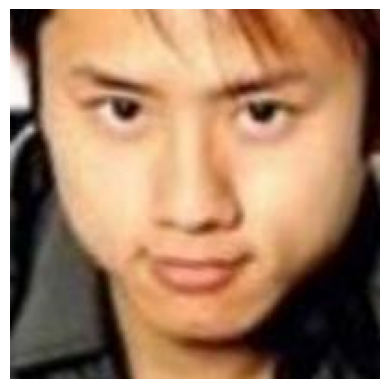

In [ ]:
from PIL import Image
img = Image.open(df['image_path'][0])
plt.axis('off')
plt.imshow(img)

<Axes: xlabel='age', ylabel='Density'>

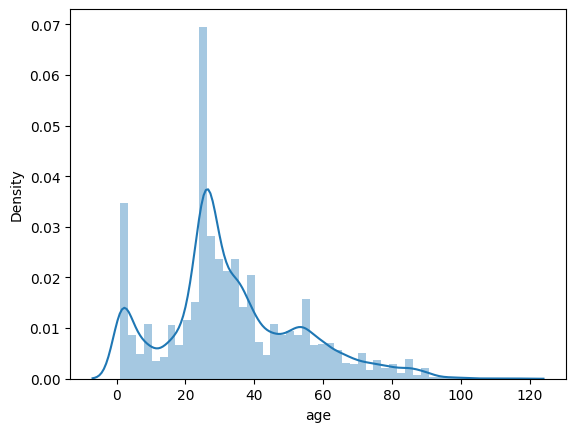

In [ ]:
sns.distplot(df['age'])

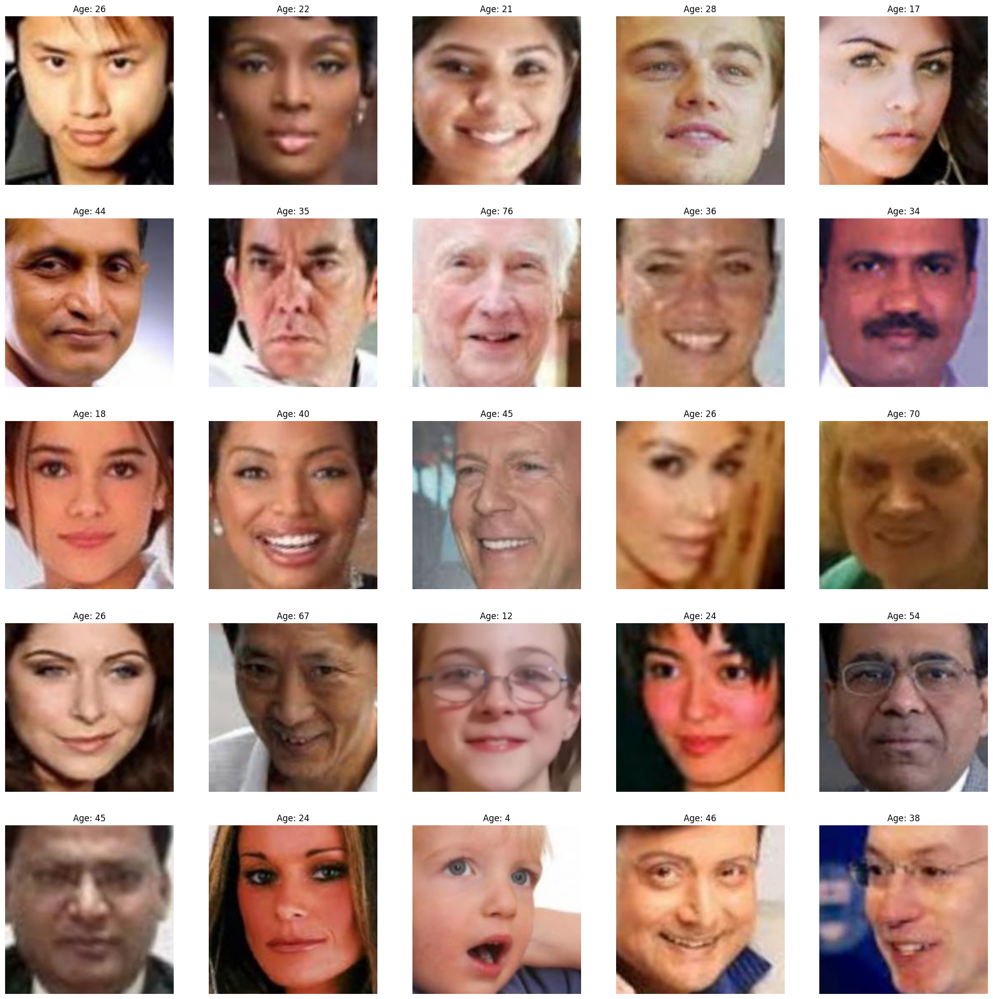

In [ ]:
plt.figure(figsize=(25,25))
images = df.iloc[0:25]

for index, file, age in images.itertuples():
    plt.subplot(5,5,index+1)
    img = Image.open(file)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Age: {age}")

### Feature Extraction

In [ ]:
from keras.utils import load_img
def extract_features(images):
    features = []
    for image in tqdm(images):
        img = load_img(image,color_mode='grayscale')
        img = img.resize((128,128),Image.ANTIALIAS)
        img = np.array(img)
        features.append(img)
    featues = np.array(features)
    features = np.reshape(features, (len(features), 128, 128, 1))
    return features

In [ ]:
X = extract_features(df['image_path'])

  0%|          | 0/23708 [00:00<?, ?it/s]

In [ ]:
X.shape

(23708, 128, 128, 1)

In [ ]:
# Normalizaing the input
X = X/255.0

In [ ]:
y_age = np.array(df['age'])

### Model Training

In [ ]:
input_shape = (128,128,1)

In [ ]:
inputs = Input((input_shape))

# Convolutional Layers
conv1 = Conv2D(32,kernel_size=(3,3),activation='relu')(inputs)
max_pool1 = MaxPooling2D(pool_size=(2,2))(conv1)
conv2 = Conv2D(64,kernel_size=(3,3),activation='relu')(max_pool1)
max_pool2 = MaxPooling2D(pool_size=(2,2))(conv2)
conv3 = Conv2D(128,kernel_size=(3,3),activation='relu')(max_pool2)
max_pool3 = MaxPooling2D(pool_size=(2,2))(conv3)
conv4 = Conv2D(256,kernel_size=(3,3),activation='relu')(max_pool3)
max_pool4 = MaxPooling2D(pool_size=(2,2))(conv4)

flatten = Flatten()(max_pool4)

dense = Dense(256,activation='relu')(flatten)

drop_out = Dropout(0.3)(dense)

output = Dense(1,activation='relu',name='age_out')(drop_out)

model = Model(inputs=[inputs],outputs=[output])

model.compile(loss=['mae'],optimizer='adam',metrics=['accuracy'])
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 126, 126, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 12, 12, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 9216)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │     2,359,552 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ age_out (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,747,649 (10.48 MB)

 Trainable params: 2,747,649 (10.48 MB)

 Non-trainable params: 0 (0.00 B)

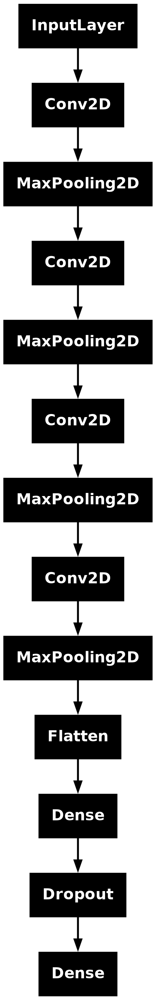

In [ ]:
from keras.utils import plot_model
plot_model(model)

In [ ]:
history = model.fit(
    x=X,
    y=y_age,
    batch_size = 32,
    epochs = 20,
    validation_split = 0.2
)

Epoch 1/20
  7/593 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - accuracy: 0.0152 - loss: 30.2111      

I0000 00:00:1719406648.398962     233 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1719406648.418855     233 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


593/593 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.0470 - loss: 16.6570

W0000 00:00:1719406663.782269     235 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1719406664.999802     233 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


593/593 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - accuracy: 0.0470 - loss: 16.6547 - val_accuracy: 0.0460 - val_loss: 12.3445
Epoch 2/20
  9/593 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - accuracy: 0.0431 - loss: 12.5043   

W0000 00:00:1719406666.637178     232 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


593/593 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.0365 - loss: 11.5680 - val_accuracy: 0.0118 - val_loss: 10.1927
Epoch 3/20
593/593 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.0145 - loss: 10.0628 - val_accuracy: 0.0078 - val_loss: 8.4078
Epoch 4/20
593/593 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.0094 - loss: 8.7232 - val_accuracy: 0.0086 - val_loss: 7.5859
Epoch 5/20
593/593 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.0087 - loss: 7.9537 - val_accuracy: 0.0112 - val_loss: 8.7759
Epoch 6/20
593/593 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - accuracy: 0.0077 - loss: 7.4457 - val_accuracy: 0.0078 - val_loss: 7.3519
Epoch 7/20
593/593 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - accuracy: 0.0065 - loss: 7.0911 - val_accuracy: 0.0053 - val_loss: 6.8878
Epoch 8/20
593/593 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - accuracy: 0.0065 - loss: 6.8567 - val_accuracy: 0.0049 - val_loss: 7.2574
Epoch 9/20
593/593 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - accuracy: 0.0062 - loss: 6.5465 - val_accuracy: 0.

### Plotting the Results

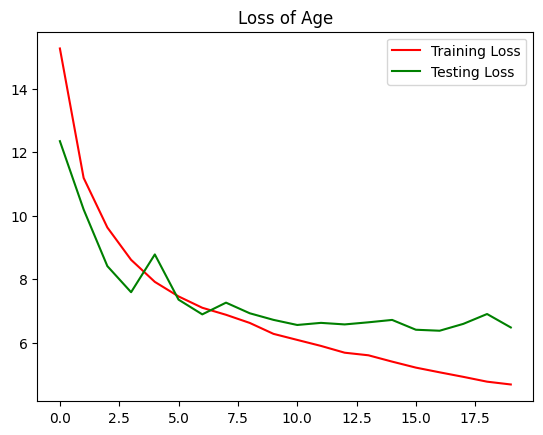

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.title("Loss of Age")
plt.plot(loss,'r',label='Training Loss')
plt.plot(val_loss,'g',label='Testing Loss')
plt.legend()

### Making Predictions

Actual Age:  58
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Predicted Age:  61


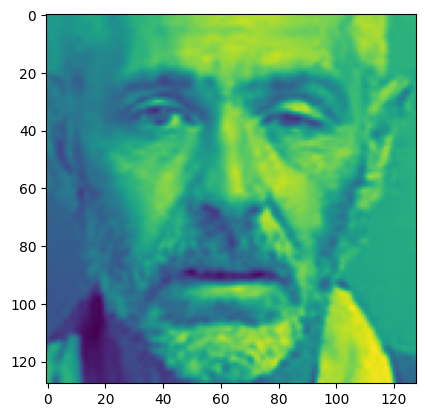

In [ ]:
image_index = 152
print("Actual Age: ",y_age[image_index])
y_pred = model.predict(X[image_index].reshape(1,128,128,1))
pred_age = round(y_pred[0][0])
print("Predicted Age: ",pred_age)
plt.imshow(X[image_index])

Actual Age:  54
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Predicted Age:  44


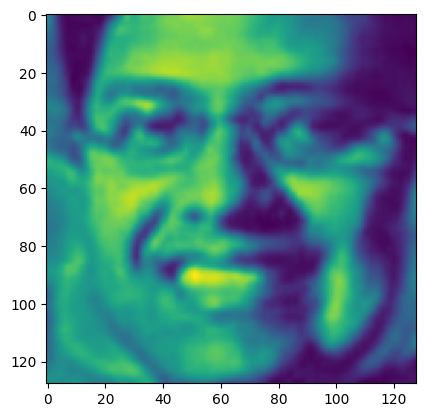

In [ ]:
image_index = 485
print("Actual Age: ",y_age[image_index])
y_pred = model.predict(X[image_index].reshape(1,128,128,1))
pred_age = round(y_pred[0][0])
print("Predicted Age: ",pred_age)
plt.imshow(X[image_index])

Actual Age:  37
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Predicted Age:  42


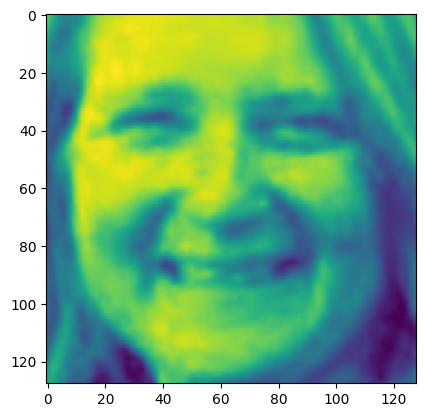

In [ ]:
image_index = 4000
print("Actual Age: ",y_age[image_index])
y_pred = model.predict(X[image_index].reshape(1,128,128,1))
pred_age = round(y_pred[0][0])
print("Predicted Age: ",pred_age)
plt.imshow(X[image_index])

In [ ]:
model.export('Age Prediction Model')

Saved artifact at 'Age Prediction Model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name='keras_tensor_13')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  139714361367312: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139714359729440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139714359733840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139714359731552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139714362782320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139714362780560: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139714362778624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139714362777216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139714362780208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139714362776160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1397143